# 4. Figure 3

This notebook is used to create the panels of Figure 3.

Before starting, use 1.Preprocessing notebook to generate:
- SC1_normalized.h5ad - Normalized single-cell data

Download data available at Metabolights [www.ebi.ac.uk/metabolights/MTBLS11236], study identifier MTBLS11236 and move to data folder:
- Bulk1_TIC.csv - Bulk LC-MS/MS data for HeLa/NIH3T3 experiment
- SC1_metabolite_IDs.csv - Metabolite metadata
- SC1_DA_markers.csv - Selected SC markers
    - For a full list execute Panel M

In [61]:
from pathlib import Path
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
import numpy as np
import re
import pandas as pd
import scanpy as sc
from scipy import stats
from anndata import read_h5ad

import sys
sys.path.insert(0, '../functions/')
import pl
import utils

### Set plot style

In [62]:
%matplotlib inline
%config InlineBackend.figure_formats=['retina']
sns.set(rc={'figure.figsize':(5, 5),
            'legend.frameon':False},
        style='ticks',
        context='talk')

# Render figures with higher resolution.
plt.rcParams['figure.dpi']=200
# Save with transparent regions white background.
plt.rcParams['savefig.facecolor']='white'

### Set color palette

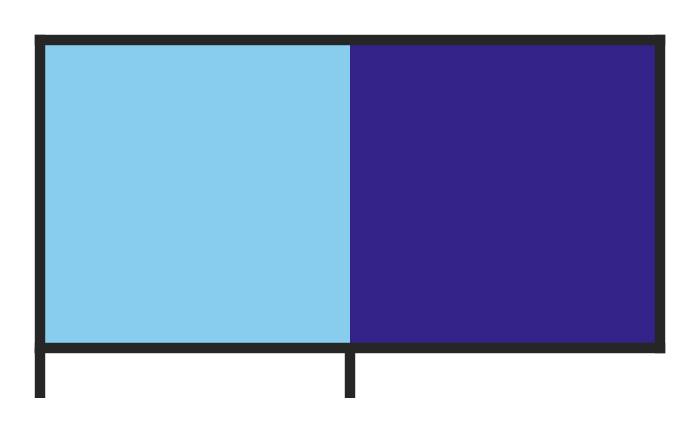

In [63]:
#color palette
palette = [(136,204,238),(51,34,136)]
palette = [(e[0]/255.0, e[1]/255.0, e[2]/255.0) for e in palette]
cmap = ListedColormap(palette)
sns.color_palette(palette=None,as_cmap=True)
sns.palplot(palette)

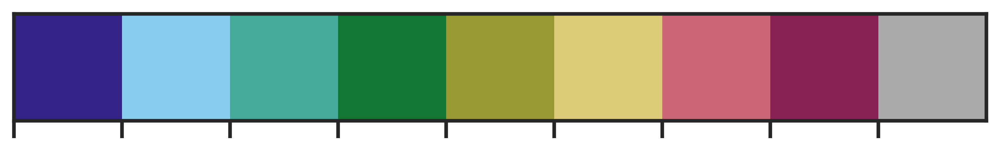

In [64]:
#color palette2
palette2 = [(51,34,136),(136,204,238),(68,170,153),(17,119,51),(153,153,51),(221,204,119),(204,102,119),(136,34,85),(170,170,170)]
palette2 = [(e[0]/255.0, e[1]/255.0, e[2]/255.0) for e in palette2]
cmap = ListedColormap(palette2)
sns.color_palette(palette=None,as_cmap=True)
sns.palplot(palette2)

## Panel A

### Set paths

In [5]:
#input
data_dir = Path(r'../data')
anndata_path = data_dir / 'SC1_normalized.h5ad'

#output
plots_path =  Path(r'../') / 'figures' / 'figure_3'
plots_path.mkdir(parents=True, exist_ok=True)
sc.settings.figdir = plots_path

### Load data

In [6]:
#load anndata file
adata =  sc.read_h5ad(anndata_path)
adata.raw = adata

In [7]:
#select a column from adata that contains replicate and cell line information
refcol = 'slide_condition_rep'

#compute mean ion intensity for every replicate
mean_intra = utils.calculate_mean_intrareplicate(adata, refcol, nonzero=False)
#chnage dataframe format
mean_scat = mean_intra.transpose().astype('float64')

### Scatterplots
#### HeLa

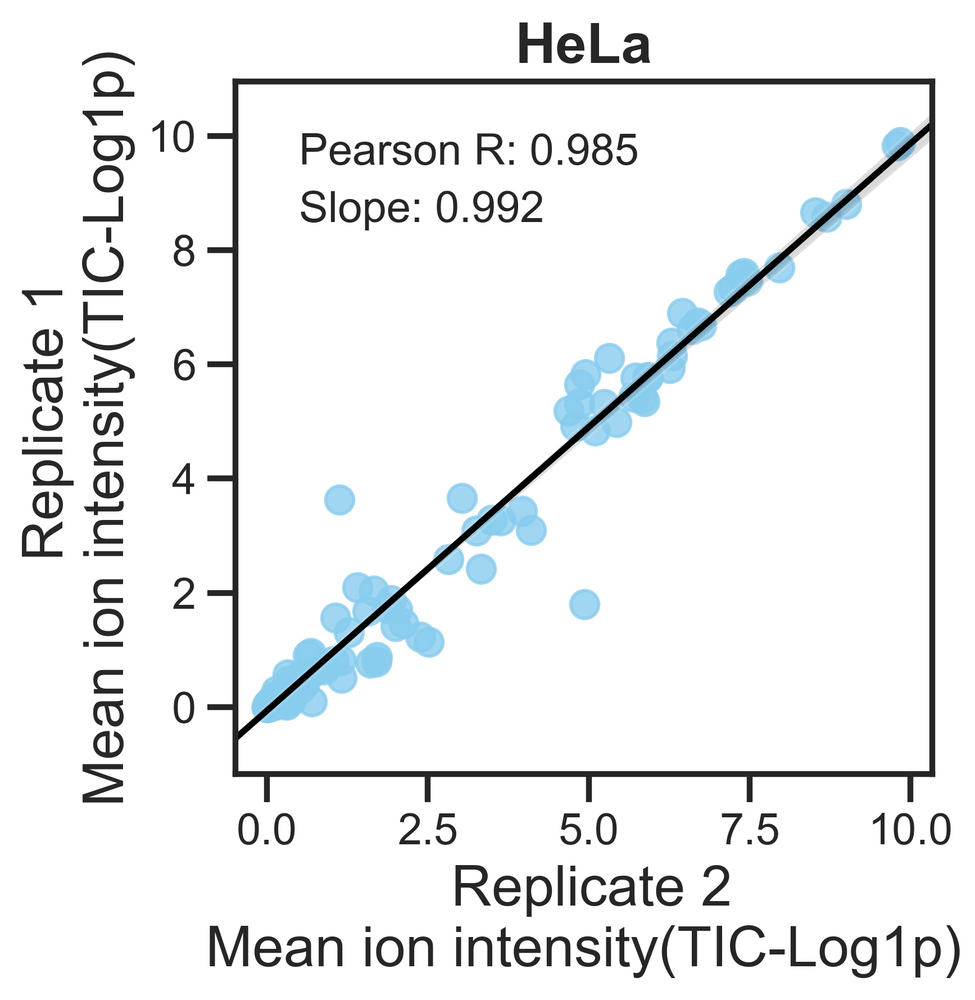

In [8]:
pearsonr = stats.pearsonr(mean_scat['Slide2_HeLa_8'],
                          mean_scat['Slide2_HeLa_18'],
                          alternative='two-sided')
slope = stats.linregress(x=mean_scat['Slide2_HeLa_8'],
                         y=mean_scat['Slide2_HeLa_18'])

plt.figure(figsize=(4,4))
ax = sns.regplot(data=mean_scat,
                 x='Slide2_HeLa_8',
                 y='Slide2_HeLa_18',
                 fit_reg =True,
                 ci=95,
                 line_kws={'lw':'2', 'color':'black'},
                 scatter=True,
                 color='#88cceeff',
                 truncate=False)

ax.minorticks_off()
plt.text(x=0.5,y=8.5, s=f'Slope: {slope[0]:.3f}', size=14)
plt.text(x=0.5,y=9.5, s=f'Pearson R: {pearsonr.statistic:.3f}', size=14)
plt.ylabel(ylabel=u' Replicate 1\nMean ion intensity(TIC-Log1p)', size = 18)
plt.xlabel(xlabel=u' Replicate 2\nMean ion intensity(TIC-Log1p)', size = 18)
ax.tick_params('both', labelsize=14)
plt.title('HeLa', fontsize=18, fontweight='bold')

plt.savefig(plots_path / 'panel_A_HeLa.png', bbox_inches='tight')
plt.savefig(plots_path / 'panel_A_HeLa.svg', bbox_inches='tight')

#### NIH3T3

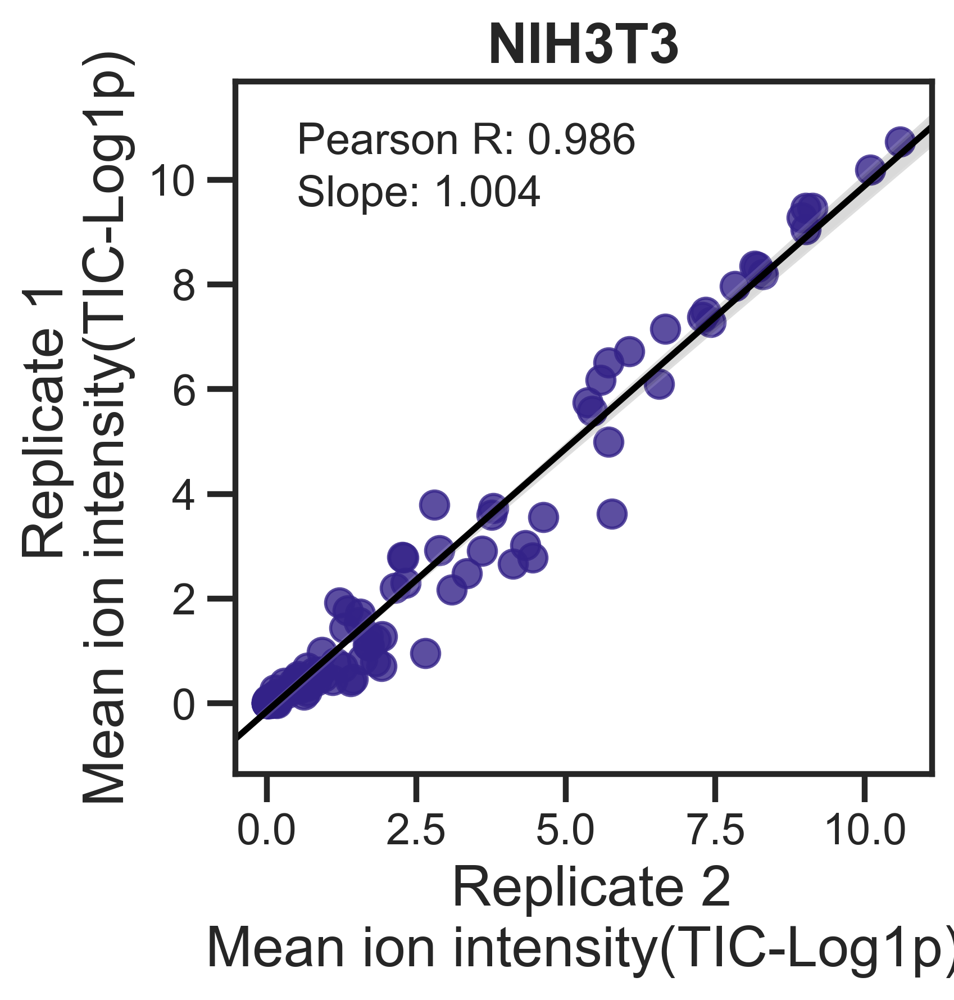

In [9]:
pearsonr = stats.pearsonr(mean_scat['Slide2_NIH3T3_16'],
                          mean_scat['Slide2_NIH3T3_19'],
                          alternative='two-sided')
slope = stats.linregress(x=mean_scat['Slide2_NIH3T3_16'],
                         y=mean_scat['Slide2_NIH3T3_19'])

plt.figure(figsize=(4,4))
ax = sns.regplot(data=mean_scat,
                 x='Slide2_NIH3T3_16',
                 y='Slide2_NIH3T3_19',
                 fit_reg =True,
                 ci=95,
                 line_kws={'lw':'2', 'color':'black'},
                 scatter=True,
                 color='#332288ff',
                 truncate=False)

ax.minorticks_off()
ax.tick_params('both', labelsize=14)
plt.text(x=0.5,y=9.5, s=f'Slope: {slope[0]:.3f}', size=14)
plt.text(x=0.5,y=10.5, s=f'Pearson R: {pearsonr.statistic:.3f}', size=14)
plt.ylabel(ylabel=u' Replicate 1\nMean ion intensity(TIC-Log1p)', size = 18)
plt.xlabel(xlabel=u' Replicate 2\nMean ion intensity(TIC-Log1p)', size = 18)
plt.title('NIH3T3', fontsize=18, fontweight='bold')

plt.savefig(plots_path / 'panel_A_NIH3T3.png', bbox_inches='tight')
plt.savefig(plots_path / 'panel_A_NIH3T3.svg', bbox_inches='tight')

## Panel B

### Set paths

In [10]:
#input
data_dir = Path(r'../data')
anndata_path = data_dir / 'SC1_normalized.h5ad'

#output
plots_path =  Path(r'../') / 'figures' / 'figure_3'
plots_path.mkdir(parents=True, exist_ok=True)
sc.settings.figdir = plots_path

### Load data

In [11]:
#load anndata file
adata =  sc.read_h5ad(anndata_path)
adata.raw = adata

In [12]:
#select a column from adata that contains replicate and cell line information
refcol = 'slide_condition_rep'

#compute mean ion intensity for every replicate
mean_intra = utils.calculate_mean_intrareplicate(adata, refcol, nonzero=False)
mean_intra

#calculate pearson correlation among all replicates within each cell line
corr = utils.calculate_correlation(mean_intra)

#filter for correlation among replicates from different slide
#Between replicates from slide 1 x 2,3
corr_1 = corr.loc[(corr['slide_col1']=='Slide1') & 
                  (corr['slide_col2']!='Slide1')]
#Between replicates from slide 2 x 3 
corr_2 = corr.loc[(corr['slide_col1']=='Slide2') & 
                   (corr['slide_col2']!='Slide2')]
corr_diff_slide = pd.concat(objs=[corr_1, corr_2], join='outer', axis=0)

### Histogram and boxplots
Correlation among replicates from different slides

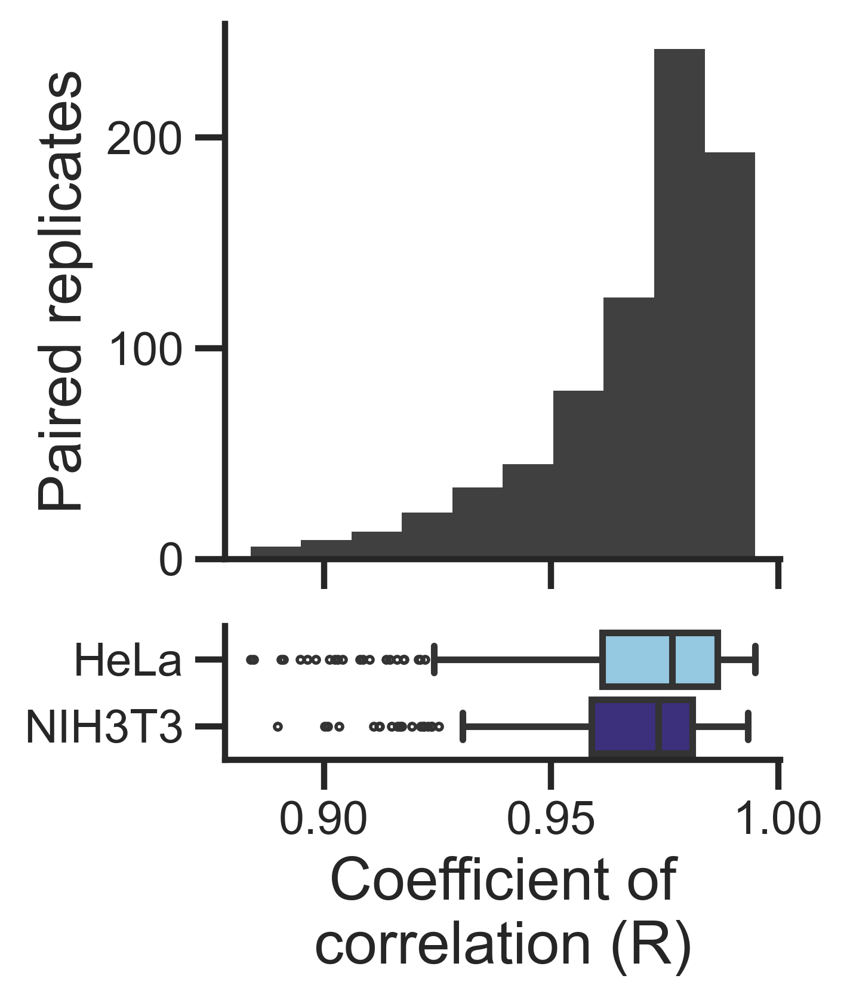

In [13]:
f = plt.figure(figsize=(3, 4))
gs = f.add_gridspec(2, 1, height_ratios=(4,1)) # Defining a gridspec where the subplots are places
ax_down = f.add_subplot(gs[1, 0]) # The margin plots are sharing an axis with the main plot
ax_main = f.add_subplot(gs[0, 0], sharex=ax_down) # The histogram

sns.histplot(data=corr_diff_slide, 
            x='R', 
            bins=10, 
            linewidth=0, 
            color='Black',
            legend=False,
            ax=ax_main)

sns.boxplot(data=corr_diff_slide, 
            x='R', 
            y='condition', 
            fliersize=2,
            linewidth=2,
            legend=False,
            palette=palette,
            hue='condition',
            orient='h',
            ax=ax_down)

ax_main.tick_params('both', labelsize=14)
ax_down.tick_params('both', labelsize=14)
ax_main.set_ylabel('Paired replicates', fontsize = 18)
ax_down.set_ylabel('')
ax_main.set_xlabel('')
ax_down.set_xlabel(u'Coefficient of\ncorrelation (R)', fontsize=18)
plt.setp(ax_main.get_xticklabels(), visible=False)
plt.setp(ax_down.get_xticklabels(minor=True), visible=True)
sns.despine(offset=0, trim=False, ax=ax_down)
sns.despine(trim=False, ax=ax_main)

plt.savefig(plots_path / 'panel_B.png', bbox_inches='tight')
plt.savefig(plots_path / 'panel_B.svg', bbox_inches='tight')

## Panel C

### Set paths

In [14]:
#input
data_dir = Path(r'../data')
anndata_path = data_dir / 'SC1_normalized.h5ad'

#output
plots_path =  Path(r'../') / 'figures' / 'figure_3'
plots_path.mkdir(parents=True, exist_ok=True)
sc.settings.figdir = plots_path

### Load data

In [15]:
#load anndata file
adata =  sc.read_h5ad(anndata_path)
adata.raw = adata

In [16]:
#select a column from adata that contains replicate and cell line information
refcol = 'slide_condition_rep'

#compute mean ion intensity for every replicate
mean_intra = utils.calculate_mean_intrareplicate(adata, refcol, nonzero=False)
mean_intra

#calculate pearson correlation among all replicates within each cell line
corr = utils.calculate_correlation(mean_intra)

### Histogram and boxplots
Overall correlation

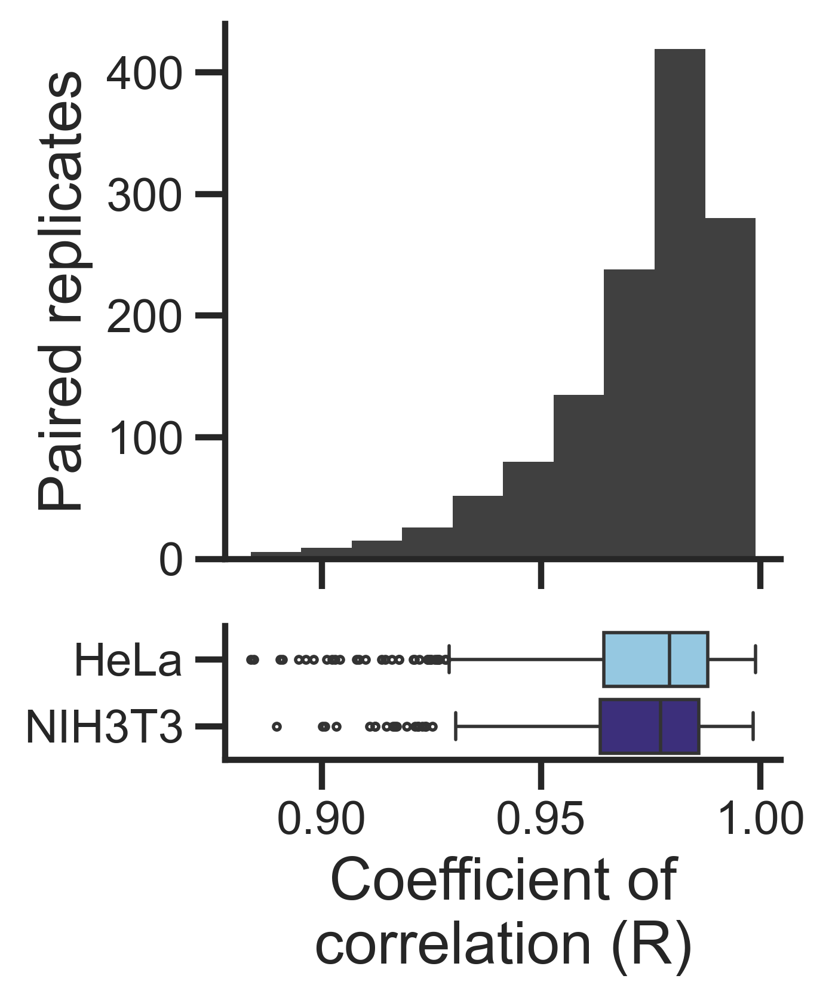

In [17]:
f = plt.figure(figsize=(3, 4))
gs = f.add_gridspec(2, 1, height_ratios=(4,1)) # Defining a gridspec where the subplots are places
ax_down = f.add_subplot(gs[1, 0]) # The margin plots are sharing an axis with the main plot
ax_main = f.add_subplot(gs[0, 0], sharex=ax_down) # Histogram

sns.histplot(data=corr, 
            x='R', 
            bins=10, 
            linewidth=0, 
            color='Black',
            legend=False,
            ax=ax_main)

sns.boxplot(data=corr, 
            x='R', 
            y='condition', 
            palette=palette,
            hue='condition',
            fliersize=2,
            legend=False,
            orient='h',
            ax=ax_down)

ax_main.tick_params('both',labelsize=14)
ax_down.tick_params('both',labelsize=14)
ax_main.set_ylabel('Paired replicates', fontsize=18)
ax_down.set_ylabel('')
ax_main.set_xlabel('')
ax_down.set_xlabel(u'Coefficient of\ncorrelation (R)', fontsize=18)
plt.setp(ax_main.get_xticklabels(minor=False), visible=False)
plt.setp(ax_down.get_xticklabels(minor=True), visible=True)
sns.despine(offset=0, trim=False, ax=ax_down)
sns.despine(trim=False, ax=ax_main)

plt.savefig(plots_path / 'panel_C.png', bbox_inches='tight')
plt.savefig(plots_path / 'panel_C.svg', bbox_inches='tight')

## Panel D

### Set paths

In [18]:
#input
data_dir = Path(r'../data')
anndata_path = data_dir / 'SC1_normalized.h5ad'

#output
plots_path =  Path(r'../') / 'figures' / 'figure_3'
plots_path.mkdir(parents=True, exist_ok=True)
sc.settings.figdir = plots_path

### Load data

In [19]:
#load anndata file
adata =  sc.read_h5ad(anndata_path)
adata.raw = adata

In [20]:
#select a column from adata that contains replicate and cell line information
refcol = 'slide_condition_rep'

#compute mean ion intensity for every replicate
mean_intra = utils.calculate_mean_intrareplicate(adata, refcol, nonzero=False)

#compute mean ion intensity per slide
mean_slide = mean_intra.reset_index()
mean_slide['slide_condition'] = mean_slide['index'].apply(lambda x: re.findall('^Slide[0-9]+_[A-Za-z0-9]+', x)[0])
mean_slide['replicate'] = mean_slide['index'].apply(lambda x: re.findall('[0-9]+$', x)[0]) 
mean_slide = mean_slide.groupby('slide_condition')[mean_slide.columns[1:-2]].mean().transpose()

#compute pearsoncorrelation among slides
corr_slide=mean_slide.corr(method='pearson')
corr_slide=corr_slide.reindex(columns=['Slide1_HeLa','Slide2_HeLa','Slide3_HeLa','Slide1_NIH3T3','Slide2_NIH3T3','Slide3_NIH3T3'],
                             index=['Slide1_HeLa','Slide2_HeLa','Slide3_HeLa','Slide1_NIH3T3','Slide2_NIH3T3','Slide3_NIH3T3'])

### Heat map
Slide-to-slide correlation

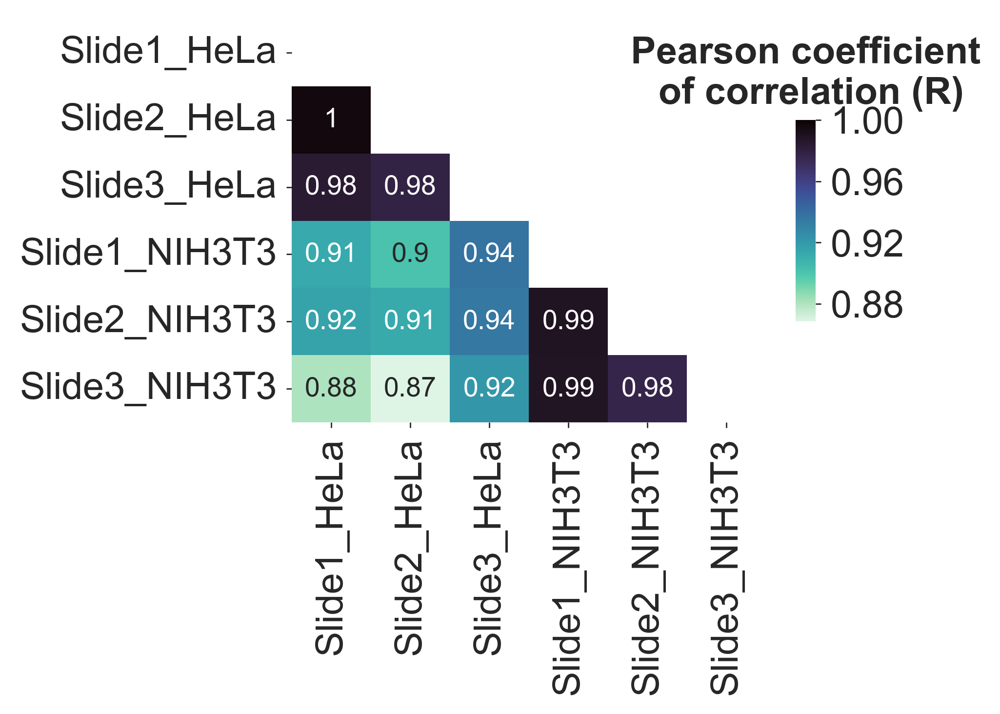

In [21]:
# Generate a mask for the upper triangle
plt.figure(figsize=(5, 4))
mask = np.zeros_like(corr_slide)
mask[np.triu_indices_from(mask)]=True

ax = sns.heatmap(corr_slide,
                 cmap='mako_r',
                 annot=True,
                 vmax=1.00,
                 annot_kws={'size': 10},
                 cbar_kws={'aspect':10, 'shrink':0.5}, 
                 mask=mask)

cax = ax.figure.axes[-1]
pax = ax.figure.axes[0]
pax.tick_params(width=0.5, length=2,labelsize=14)
cax.tick_params(width=0.5, length=2,labelsize=14)
cax.set_yticks(ticks=(0.88, 0.92, 0.96, 1.00))
cax.set_title('Pearson coefficient\n of correlation (R)', size =14, weight='bold')
plt.ylabel(None)
plt.xlabel(None)
plt.tight_layout()

plt.savefig(plots_path / 'panel_D.png', bbox_inches='tight')
plt.savefig(plots_path / 'panel_D.svg', bbox_inches='tight')

## Panel E

### Set paths

In [22]:
#input
data_dir = Path(r'../data')
anndata_path = data_dir / 'SC1_normalized.h5ad'

#output
plots_path =  Path(r'../') / 'figures' / 'figure_3'
plots_path.mkdir(parents=True, exist_ok=True)
sc.settings.figdir = plots_path

### Load data

In [23]:
#load anndata file
adata =  sc.read_h5ad(anndata_path)
adata.raw = adata

In [24]:
#select a column from adata that contains replicate and cell line information
refcol = 'slide_condition_rep'

#compute mean ion intensity for every replicate
mean_intra = utils.calculate_mean_intrareplicate(adata, refcol, nonzero=True)

#compute Coefficient of Variation for each ion across replicates
key = ['condition','ion']
CV_metric = utils.calculate_CV(mean_replicate=mean_intra, key=key, column=refcol)

### Scatterplot

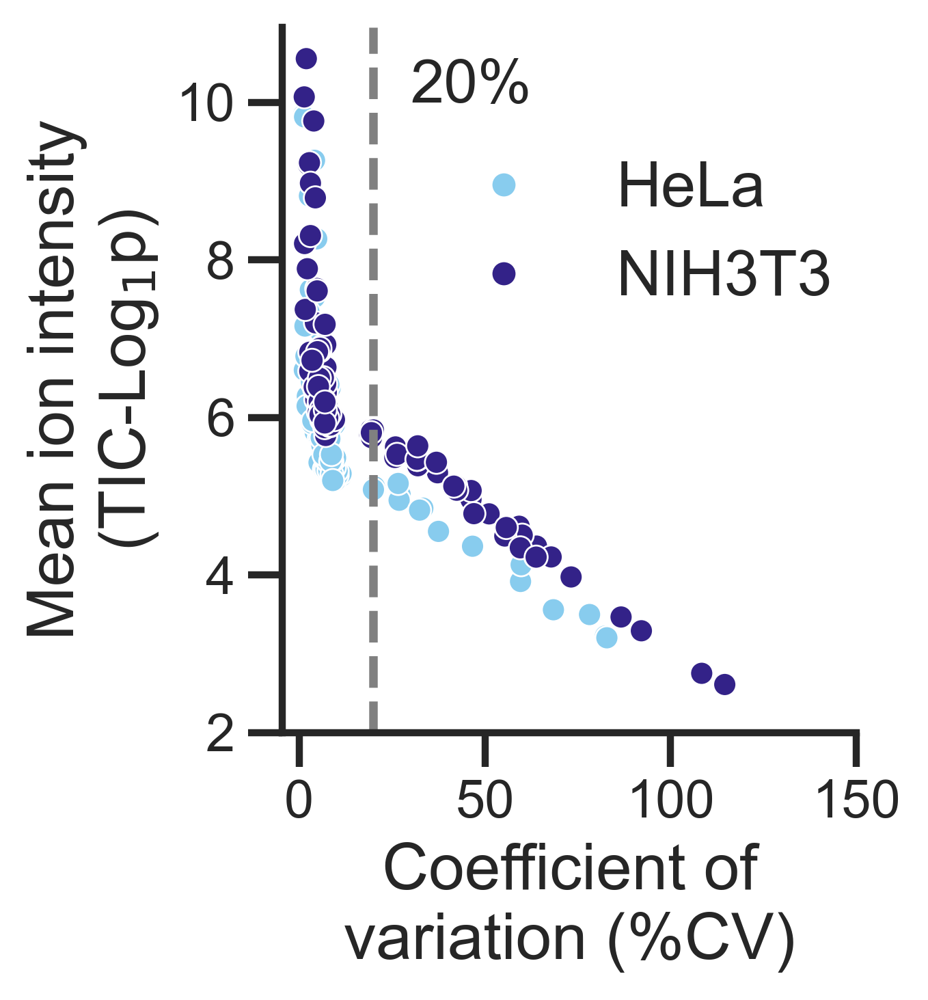

In [25]:
sns.set_style('ticks',)
ax = sns.relplot(data=CV_metric, 
                 x='CV',
                 y='mean',
                 hue='condition',
                 height=4,
                 aspect=.95,
                 kind='scatter',
                 palette=palette,
                 s=37)

ax._legend.set_bbox_to_anchor([0.6,0.7])
ax._legend.set_title(None)
ax.set_xlabels('Coefficient of\nvariation (%CV)', fontsize=17)
ax.set_ylabels(label=u'Mean ion intensity\n(TIC-Log$_1$p)', fontsize=17)
ax.set_titles(col_template='')
ax.set(xticks=(0,50,100,150))
ax.set(yticks=(2,4,6,8,10))
plt.yticks(fontsize=14)
plt.xticks(fontsize=14)
plt.tight_layout()

ax.refline(x=20)
for ax in plt.gcf().axes:
    ax.text(30,10,'20%', fontsize=16)

plt.savefig(plots_path / 'panel_E.png', bbox_inches='tight')
plt.savefig(plots_path / 'panel_E.svg', bbox_inches='tight')

## Panel F

### Set paths

In [26]:
#input
data_dir = Path(r'../data')
anndata_path = data_dir / 'SC1_normalized.h5ad'

#output
plots_path =  Path(r'../') / 'figures' / 'figure_3'
plots_path.mkdir(parents=True, exist_ok=True)
sc.settings.figdir = plots_path

### Load data

In [27]:
#load anndata file
adata =  sc.read_h5ad(anndata_path)
adata.raw = adata

In [28]:
#select a column from adata that contains replicate and cell line information
refcol = 'slide_condition_rep'

#compute mean ion intensity for every replicate
mean_intra = utils.calculate_mean_intrareplicate(adata, refcol, nonzero=True)

#compute Coefficient of Variation for each ion across replicates
key = ['condition','ion']
CV_metric = utils.calculate_CV(mean_replicate=mean_intra, key=key, column=refcol)

#average CV per ion
average_CV = CV_metric.groupby('ion')['CV'].mean().to_frame().reset_index()

#rank smallest CVs
metric = 'CV'
n_top = 10
rank_smallest = average_CV.nsmallest(n_top, columns=metric)

### Barplot

/var/folders/yd/30x9k4ks4xgcqd7x9_jk19c40000gn/T/ipykernel_33986/1937037474.py:11: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(['Glutamine',


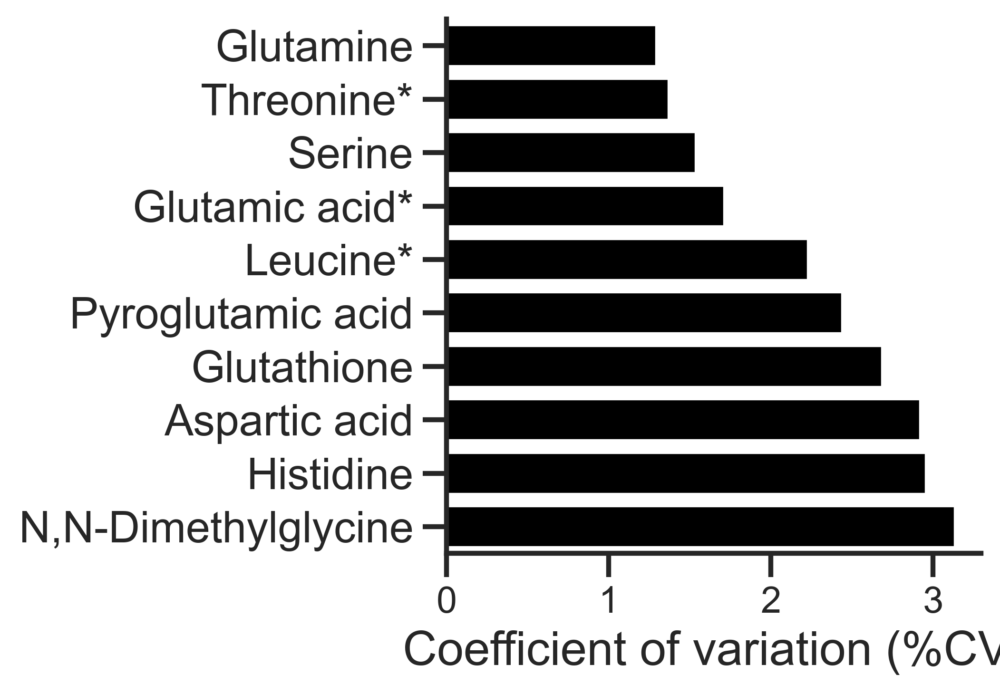

In [29]:
plt.figure(figsize=(5.6, 4))
ax = sns.barplot(data=rank_smallest,
                 x=metric,
                 y='ion',
                 orient='h',
                 color='black',
                 legend=None)

ax.set_xlabel('Coefficient of variation (%CV)', fontsize=18)
ax.set_ylabel('')
ax.set_yticklabels(['Glutamine',
                    'Threonine*', 
                    'Serine',
                    'Glutamic acid*',
                    'Leucine*',
                    'Pyroglutamic acid',
                    'Glutathione',
                    'Aspartic acid',
                    'Histidine',
                    'N,N-Dimethylglycine'],fontsize=16)
sns.despine(offset=0,trim=False, ax=ax)
plt.xticks(ticks=[0,1,2,3], fontsize=14)
plt.tight_layout()

plt.savefig(plots_path / 'panel_F.png', bbox_inches='tight')
plt.savefig(plots_path / 'panel_F.svg', bbox_inches='tight')

## Panel G

### Set paths

In [30]:
#input
data_dir = Path(r'../data')
anndata_path = data_dir / 'SC1_normalized.h5ad'
metabolite_path = data_dir / 'SC1_metabolite_IDs.csv'

#output
plots_path =  Path(r'../') / 'figures' / 'figure_3'
plots_path.mkdir(parents=True, exist_ok=True)
sc.settings.figdir = plots_path

### Load data

In [31]:
#load anndata file
adata =  sc.read_h5ad(anndata_path)
adata.raw = adata

metabolite_ID = pd.read_csv(metabolite_path)

In [32]:
#select a column from adata that contains replicate and cell line information
refcol = 'slide_condition_rep'

#compute mean ion intensity for every replicate
mean_intra = utils.calculate_mean_intrareplicate(adata, refcol, nonzero=True)

#compute Coefficient of Variation for each ion across replicates
key = ['condition','ion']

CV_metric = utils.calculate_CV(mean_replicate=mean_intra, key=key, column=refcol)
CV_class = CV_metric.merge(metabolite_ID, on='ion')

### Boxplot

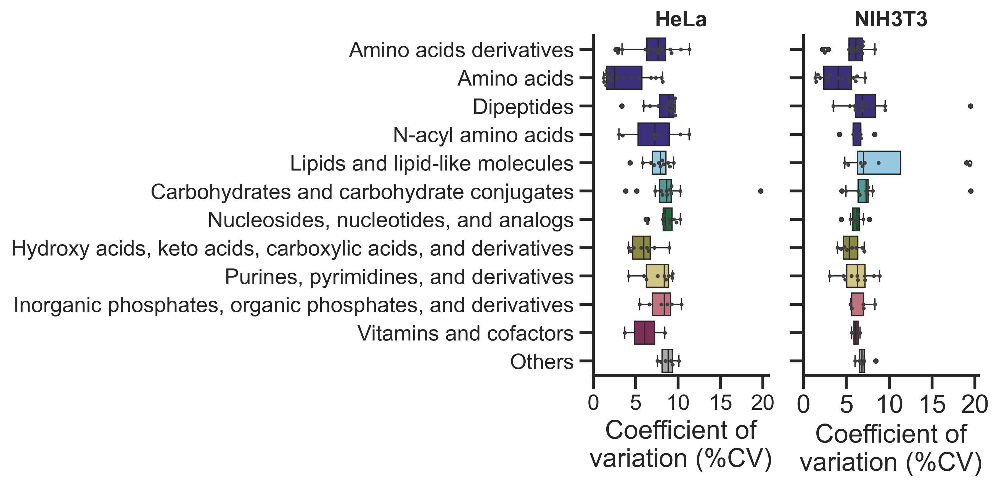

In [33]:
specific_order = ['Amino acids derivatives',
                  'Amino acids',
                  'Dipeptides',
                  'N-acyl amino acids',
                  'Lipids and lipid-like molecules',
                  'Carbohydrates and carbohydrate conjugates',
                  'Nucleosides, nucleotides, and analogs',
                  'Hydroxy acids, keto acids, carboxylic acids, and derivatives',
                  'Purines, pyrimidines, and derivatives',
                  'Inorganic phosphates, organic phosphates, and derivatives',
                  'Vitamins and cofactors',
                  'Others']

# Convert the column to categorical with the specific order
CV_class['subclass'] = pd.Categorical(CV_class['subclass'], categories=specific_order, ordered=True)

# Sort the DataFrame based on the categorical order
CV_class = CV_class.sort_values(by='subclass')

f = plt.figure(figsize=(4.5, 4))
gs = f.add_gridspec(nrows=1, ncols=2) # Defining a gridspec where the subplots are places
ax_right = f.add_subplot(gs[0, 1])
ax_main = f.add_subplot(gs[0, 0], sharey=ax_right)

sns.boxplot(data=CV_class.loc[(CV_class['CV']<=20) & (CV_class['condition']=='HeLa')], 
            x='CV',
            y='subclass',
            orient='h',
            hue='class',
            palette=palette2,
            showfliers=True,
            fliersize=2.5,
            linewidth=0.8,
            legend = False,
            ax=ax_main)
sns.swarmplot(data=CV_class.loc[(CV_class['CV']<=20) & (CV_class['condition']=='HeLa')], 
              x='CV',
              y='subclass',
              orient='h',
              color='0.25',
              size=2.5,
              ax=ax_main)

sns.boxplot(data=CV_class.loc[(CV_class['CV']<=20) & (CV_class['condition']=='NIH3T3')], 
            x='CV',
            y='subclass',
            orient='h',
            hue='class',
            palette=palette2,
            showfliers=True,
            fliersize=2.5,
            linewidth=0.8,
            legend=False,
            ax=ax_right)
sns.swarmplot(data=CV_class.loc[(CV_class['CV']<=20) & (CV_class['condition']=='NIH3T3')],
              x='CV',
              y='subclass',
              orient='h',
              color='0.25',
              size=2.5,
              ax=ax_right)

ax_main.set(xticks=(0,5,10,15,20))
ax_right.set(xticks=(0,5,10,15,20))
ax_main.tick_params(axis='both', labelsize=14)
ax_main.set_title('HeLa', fontsize=14, weight='bold', y =1)
ax_main.set_ylabel('')
ax_main.set_xlabel('Coefficient of\nvariation (%CV)', fontsize=17)
ax_right.set_title('NIH3T3', fontsize=14, weight='bold', y =1)
ax_right.set_ylabel('')
ax_right.set_xlabel('Coefficient of\nvariation (%CV)', fontsize=17)
sns.despine(offset=0, trim=False,  ax=ax_right)
sns.despine(trim=False, offset=0, ax=ax_main)
plt.setp(ax_main.get_yticklabels(minor=True), visible=True)
plt.setp(ax_right.get_yticklabels(minor=False), visible=False)

plt.savefig(plots_path / 'panel_G.png', bbox_inches='tight')
plt.savefig(plots_path / 'panel_G.svg', bbox_inches='tight')

## Panel H, I and K

### Set paths

In [34]:
#input
data_dir = Path(r'../data')
anndata_path = data_dir / 'SC1_normalized.h5ad'

#output
plots_path =  Path(r'../') / 'figures' / 'figure_3'
plots_path.mkdir(parents=True, exist_ok=True)
sc.settings.figdir = plots_path

### Load data

In [35]:
#load anndata file
adata =  sc.read_h5ad(anndata_path)
adata.raw = adata

In [36]:
sc.pp.pca(adata)
sc.pp.neighbors(adata, random_state=12345)
sc.tl.umap(adata, random_state=12345) 
adata.obs[['UMAP1', 'UMAP2']] = adata.obsm['X_umap']

# Using leiden for unsupervised clustering
sc.tl.leiden(adata, resolution=0.2, flavor='leidenalg')

OMP: Info #276: omp_set_nested routine deprecated, please use omp_set_max_active_levels instead.
/var/folders/yd/30x9k4ks4xgcqd7x9_jk19c40000gn/T/ipykernel_33986/4251332545.py:7: FutureWarning: In the future, the default backend for leiden will be igraph instead of leidenalg.

 To achieve the future defaults please pass: flavor="igraph" and n_iterations=2.  directed must also be False to work with igraph's implementation.
  sc.tl.leiden(adata, resolution=0.2, flavor='leidenalg')


### UMAPs
#### Panel H - Cell lines

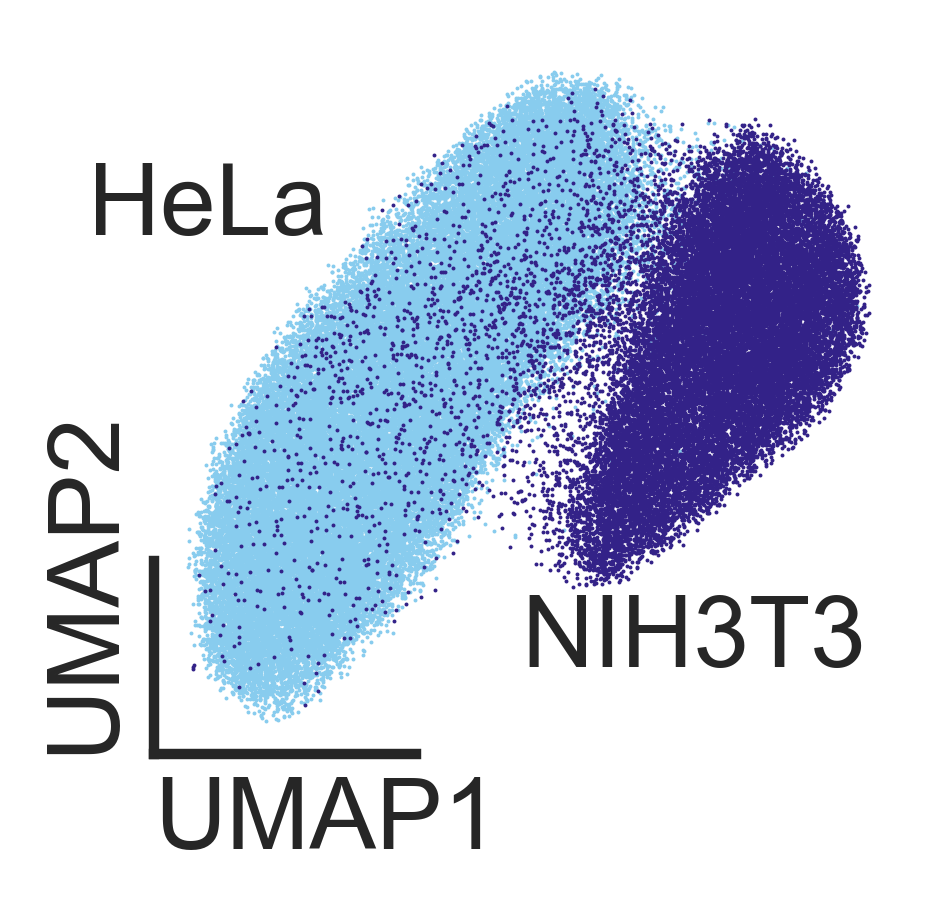

In [37]:
f = pl.highlight_scatterplot(
    data=adata,
    obsm_key='X_umap',
    hue='CellLine',  
    palette=palette,
    decorate_titles=False,
    height=3,
    aspect=1,
    trim_axes=True,
    scatter_kwargs={'s':0.5})

#f.add_legend(markerscale=6)
plt.text(x=-4, y=6, s='HeLa', size=18)
plt.text(x=5, y=-0.9, s='NIH3T3', size=18)
plt.xlabel('UMAP1', loc='left', fontsize=18)
plt.ylabel('UMAP2', loc='bottom', fontsize=18)

plt.savefig(plots_path / 'panel_H_CellLine.png', bbox_inches='tight')
plt.savefig(plots_path / 'panel_H_CellLine.svg', bbox_inches='tight')

#### Panel H - Unsupervised clustering

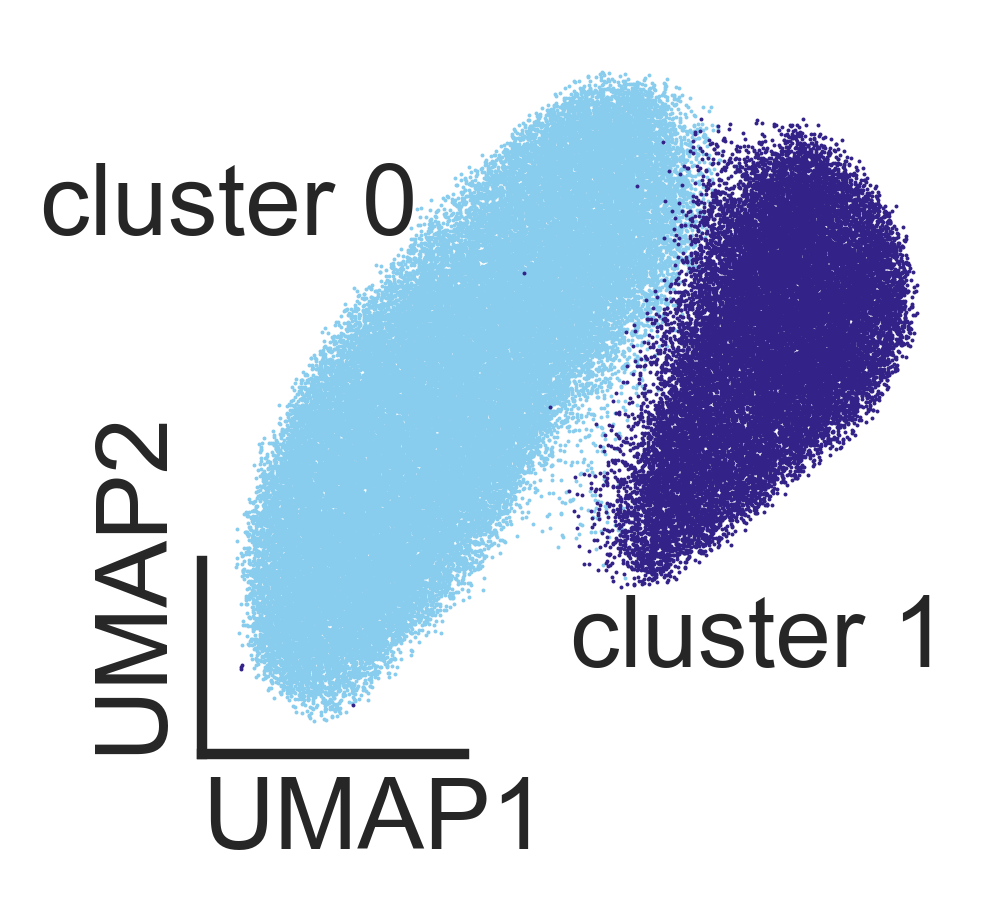

In [38]:
f = pl.highlight_scatterplot(
    data=adata,
    obsm_key='X_umap',
    hue='leiden',  
    palette=palette,
    decorate_titles=False,
    height=3,
    aspect=1,
    trim_axes=True,
    scatter_kwargs={'s':0.5})

#f.add_legend(markerscale=6)
plt.text(x=-6, y=6, s='cluster 0', size=18)
plt.text(x=5, y=-0.9, s='cluster 1', size=18)
plt.xlabel('UMAP1', loc='left', fontsize=18)
plt.ylabel('UMAP2', loc='bottom', fontsize=18)

plt.savefig(plots_path / 'panel_H_clustering.png', bbox_inches='tight')
plt.savefig(plots_path / 'panel_H_clustering.svg', bbox_inches='tight')

### Panel I - UMAP

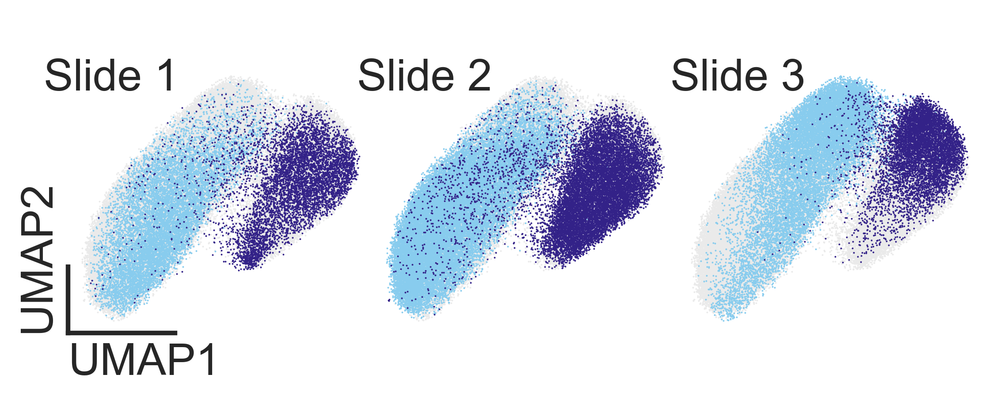

In [39]:
f = pl.highlight_scatterplot(
    data=adata,
    obsm_key='X_umap',
    hue='CellLine', 
    col='slide',  
    palette=palette,
    decorate_titles=False,
    height=3,
    aspect=0.7,
    background_color='#eaeaeaff',
    trim_axes=True, 
    scatter_kwargs={'s':0.5})

#f.add_legend(markerscale=6)
plt.subplots_adjust(wspace = 0)
f.set_titles(col_template=' ')
plt.text(x=-35, y=8, s='Slide 1', size=18)
plt.text(x=-19, y=8, s='Slide 2', size=18)
plt.text(x=-3, y=8, s='Slide 3', size=18)
plt.xlabel('UMAP1', loc='left', fontsize=18)

plt.savefig(plots_path / 'panel_I.png', bbox_inches='tight')
plt.savefig(plots_path / 'panel_I.svg', bbox_inches='tight')

#### Panel K - Markers 

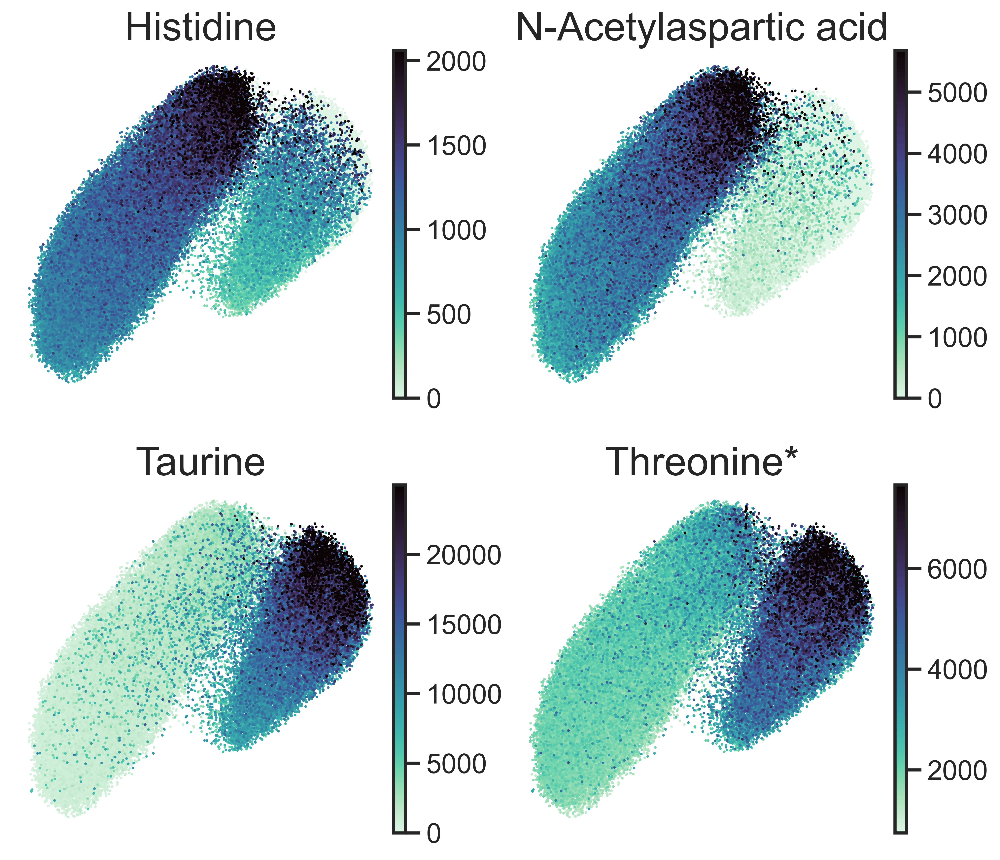

In [41]:
lower, upper = np.quantile(adata.layers['norm_counts'], [0.01, 0.99], axis=0)
adata.layers['clipped'] = np.clip(adata.layers['norm_counts'], lower, upper)

#top ranked selected markers - 2 HeLa and 2 NIH3T3
markers = ['C6H9N3O2-H','C6H9NO5-H','C2H7NO3S-H', 'C4H9NO3-H']

with plt.rc_context({'figure.figsize':(4, 4), 'figure.dpi':(300), 'axes.titlesize':24, 'legend.fontsize':22}):
    f = sc.pl.umap(adata,
                   color= markers,
                   cmap='mako_r',
                   s=10,
                   layer='clipped',
                   frameon=False,
                   ncols=2,
                   title=['Histidine','N-Acetylaspartic acid','Taurine','Threonine*'],
                   show=True,
                   return_fig=True)
    
    plt.savefig(plots_path / 'panel_K.png', bbox_inches='tight')
    plt.savefig(plots_path / 'panel_K.svg', bbox_inches='tight')

## Panel J

### Set paths

In [42]:
#input
data_dir = Path(r'../data')
anndata_path = data_dir / 'SC1_normalized.h5ad'
metabolite_path = data_dir / 'SC1_metabolite_IDs.csv'

#output
plots_path =  Path(r'../') / 'figures' / 'figure_3'
plots_path.mkdir(parents=True, exist_ok=True)
sc.settings.figdir = plots_path

### Load data

In [43]:
#load anndata file
adata = sc.read_h5ad(anndata_path)
adata.raw = adata

metabolite_ID = pd.read_csv(metabolite_path)

In [44]:
#referemces for differential analysis
reference = 'rest'
column = 'CellLine'

#compute wilcoxon-rank-sum test results
sc.tl.rank_genes_groups(adata, groupby=column, method='wilcoxon', use_raw=False, reference=reference, pts=True)

#compile differential analysis results
DA = utils.compile_differential_analysis(adata, column, reference)

In [45]:
#select a column from adata that contains replicate and cell line information
refcol = 'slide_condition_rep'

#compute mean ion intensity for every replicate
mean_intra = utils.calculate_mean_intrareplicate(adata, refcol, nonzero=False)

#compute mean ion intensity per slide
mean_condition = mean_intra.reset_index()
mean_condition['condition'] = mean_condition['index'].apply(lambda x: re.findall('_.*_', x)[0].replace('_', ''))
mean_condition = mean_condition.groupby('condition')[mean_condition.columns[1:-1]].mean().transpose().reset_index().rename(columns={'index': 'ion'})

In [46]:
#Combine mean values and differential analysis results for MA plot
MA_df = mean_condition.merge(DA, on='ion', how='inner').merge(metabolite_ID, on='ion', how='inner')

MA_df.to_csv(data_dir / 'SC1_DA.csv')

### MA plot

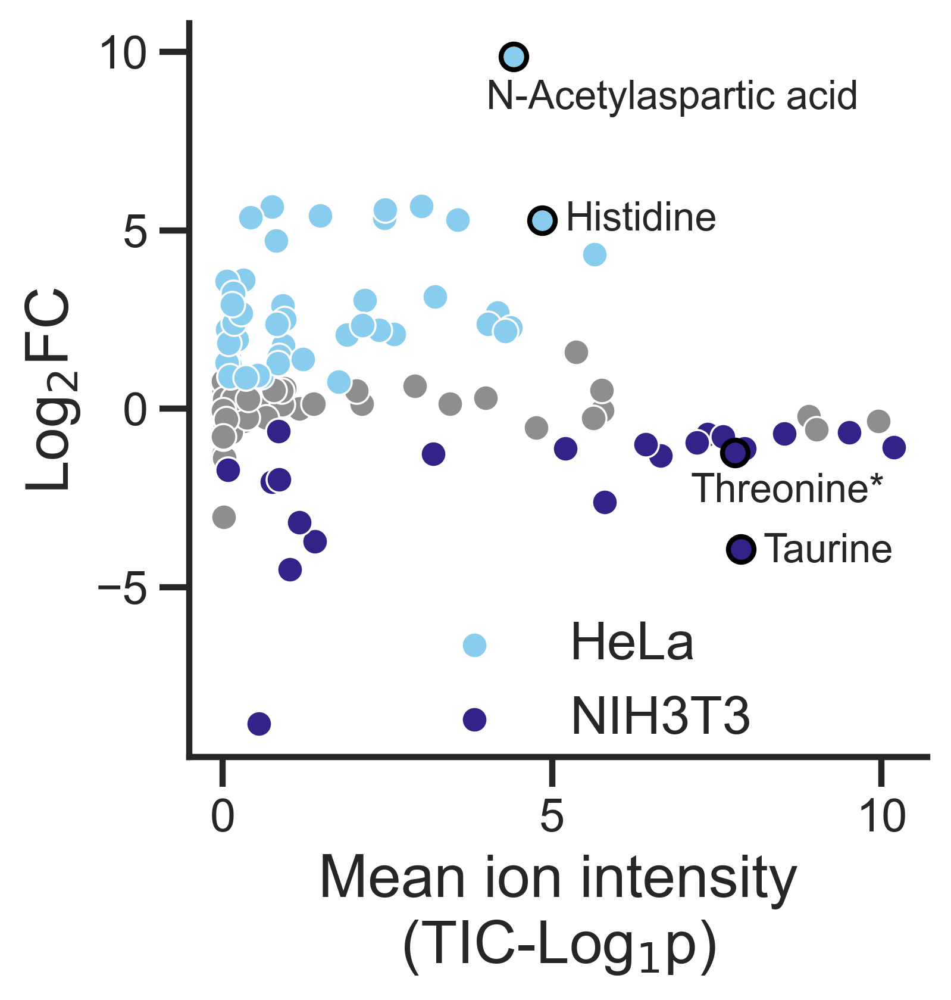

In [47]:
A = (MA_df['HeLa']+MA_df['NIH3T3'])/2
M = MA_df['HeLa_log2FC']

down = MA_df.loc[(MA_df['HeLa_log2FC']<=-0.59) &
                 (MA_df['HeLa_pvals_adj']<0.05)]

up = MA_df.loc[(MA_df['HeLa_log2FC']>=0.59) &
               (MA_df['HeLa_pvals_adj']<0.05)]

downA = (down['HeLa']+down['NIH3T3'])/2
downM = down['HeLa_log2FC']
upA = (up['HeLa']+up['NIH3T3'])/2
upM = up['HeLa_log2FC']

plt.figure(figsize=(4, 4))
sns.scatterplot(data=MA_df, 
                x=A,
                y=M,
                legend=False,
                color='#8e8e8eff',
                s=60)
sns.scatterplot(data=up, 
                x=upA,
                y=upM,
                color='#88cceeff',
                s=60,
                label='HeLa')
sns.scatterplot(data=down, 
                x=downA,
                y=downM,
                color='#332288ff',
                s=60,
                label='NIH3T3')

plt.scatter(x=7.8640925, y=-3.936817, color='#332288ff', edgecolors='black', s=60) #taurine
plt.text(x=8.2, y=-4.3, s='Taurine', size=12)
plt.scatter(x=7.775301, y=-1.240163, color='#332288ff',edgecolors='black', s=60) #threonine
plt.text(x=7.1, y=-2.6, s='Threonine*', size=12)
plt.scatter(x=4.8496085, y=5.281238, color='#88cceeff', edgecolors='black', s=60) #histidine
plt.text(x=5.2, y=5, s='Histidine', size=12)
plt.scatter(x=4.4110215, y=9.858835, color='#88cceeff', edgecolors='black', s=60) #N-Acetylaspartic acid
plt.text(x=4, y=8.4, s='N-Acetylaspartic acid', size=12)

sns.despine()
plt.legend(bbox_to_anchor=(0.25,0.25), fontsize=16)
plt.xlabel('Mean ion intensity\n(TIC-Log$_1$p)', fontsize=18)
plt.ylabel(f'Log$_2$FC', fontsize=18)
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)

plt.savefig(plots_path / 'panel_J.png', bbox_inches='tight')
plt.savefig(plots_path / 'panel_J.svg', bbox_inches='tight')

## Panel L

### Set paths

In [70]:
#input
data_dir = Path(r'../data')
anndata_path = data_dir / 'SC1_normalized.h5ad'
bulk_path = data_dir / 'Bulk1_TIC.csv'

#output
plots_path =  Path(r'../') / 'figures' / 'figure_3'
plots_path.mkdir(parents=True, exist_ok=True)
sc.settings.figdir = plots_path

### Load data

In [71]:
#load anndata file
adata = sc.read_h5ad(anndata_path)
adata.raw = adata

#compute mean ion intensity for every replicate
refcol = 'slide_condition_rep'
SC_data = utils.calculate_mean_intrareplicate(adata, refcol, nonzero=True)
SC_data.columns = SC_data.columns.str.rstrip('-H') 
SC_data = SC_data.reset_index().rename(columns={'index':'exp_cond_rep'})

#load bulk data
bulk_data = pd.read_csv(bulk_path, index_col='formula').drop(labels=['m/z','m/z_range','adduct','detection',
                                                                     'metabolites', 'validation'], axis = 1)
bulk_data = bulk_data.transpose().reset_index().rename(columns={'index':'exp_cond_rep'})

In [73]:
#check for isomers in bulk data and match with columns in SC data
bulk, SC = utils.checking_isomers(bulk_data, SC_data)
SC = SC.set_index('exp_cond_rep')
bulk = bulk.set_index('exp_cond_rep')

In [74]:
#compute Coefficient of Variation for each ion across replicates
key = ['condition','ion']
refcol = 'exp_cond_rep'

CV_SC = utils.calculate_CV(mean_replicate=SC, key=key, column=refcol).rename(columns={'mean':'mean_SC',
                                                                                      'CV':'CV_SC'})
CV_bulk = utils.calculate_CV(mean_replicate=bulk, key=key, column=refcol).rename(columns={'mean':'mean_bulk',
                                                                                      'CV':'CV_bulk'})
CV_metric = CV_SC.merge(CV_bulk, on=['ion','condition'])

In [75]:
CV_metric.to_csv(data_dir/'CV_metric.csv')

### Scatterplot

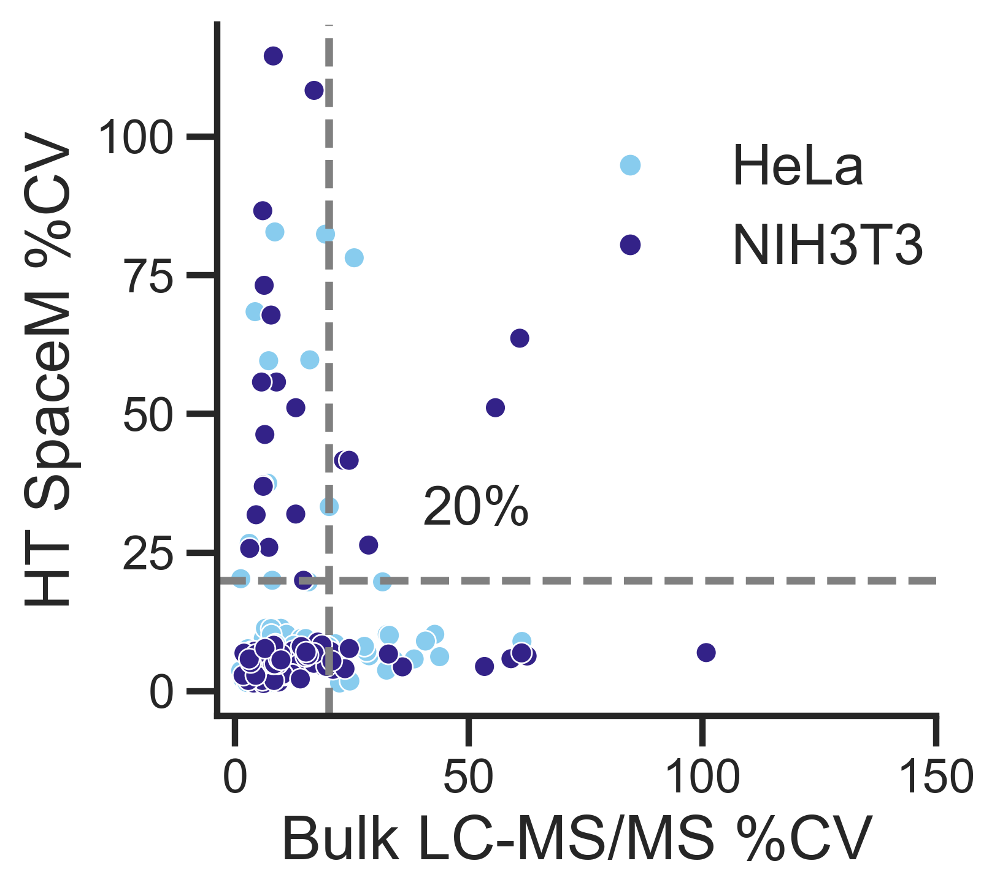

In [76]:
ax = sns.relplot(data=CV_metric, 
                 x='CV_bulk',
                 y='CV_SC',
                 hue='condition',
                 height=4,
                 aspect=0.7,
                 kind='scatter',
                 palette=palette,
                 s=37)

ax._legend.set_bbox_to_anchor([0.9,0.7])
ax._legend.set_title(None)
ax.refline(x=20, y=20)
ax.set_xlabels('Bulk LC-MS/MS %CV', fontsize=18)
ax.set_ylabels('HT SpaceM %CV', fontsize=18)
ax.set_titles(col_template='')
ax.set(xticks=(0,50,100,150))
plt.yticks(fontsize=14)
plt.xticks(fontsize=14)

for ax in plt.gcf().axes:
    ax.text(40,30,'20%', fontsize=16)
plt.tight_layout()

plt.savefig(plots_path / 'panel_L.png', bbox_inches='tight')
plt.savefig(plots_path / 'panel_L.svg', bbox_inches='tight')

## Panel M

### Set paths

In [77]:
#input
data_dir = Path(r'../data')
anndata_path = data_dir / 'SC1_normalized.h5ad'
bulk_path = data_dir / 'Bulk1_TIC.csv'

#output
plots_path =  Path(r'../') / 'figures' / 'figure_3'
plots_path.mkdir(parents=True, exist_ok=True)
sc.settings.figdir = plots_path

### Load data

In [78]:
#load anndata file
adata = sc.read_h5ad(anndata_path)
adata.raw = adata

#compute mean ion intensity for every replicate
refcol = 'slide_condition_rep'
SC_data = utils.calculate_mean_intrareplicate(adata, refcol, nonzero=True)
SC_data.columns = SC_data.columns.str.rstrip('-H') 
SC_data = SC_data.reset_index().rename(columns={'index':'exp_cond_rep'})

#load bulk data
bulk_data = pd.read_csv(bulk_path, index_col='formula').drop(labels=['m/z','m/z_range','adduct','detection',
                                                                     'metabolites', 'validation'], axis = 1)
bulk_data = bulk_data.transpose().reset_index().rename(columns={'index':'exp_cond_rep'})

In [79]:
#check for isomers in bulk data and match with columns in SC data
bulk, SC = utils.checking_isomers(bulk_data, SC_data)
SC = SC.set_index('exp_cond_rep')
bulk = bulk.set_index('exp_cond_rep')

#compute Coefficient of Variation for each ion across replicates
key = ['condition','ion']
refcol = 'exp_cond_rep'

CV_SC = utils.calculate_CV(mean_replicate=SC, key=key, column=refcol).rename(columns={'mean':'mean_SC',
                                                                                      'CV':'CV_SC'})
CV_bulk = utils.calculate_CV(mean_replicate=bulk, key=key, column=refcol).rename(columns={'mean':'mean_bulk',
                                                                                      'CV':'CV_bulk'})
CV_metric = CV_SC.merge(CV_bulk, on=['ion','condition'])

### UMAP

In [80]:
CV_filt = CV_metric.loc[(CV_metric['CV_SC']<=20) & (CV_metric['CV_bulk']<=20)]
CV_filt = CV_filt['ion']

adata_filt = adata[:, adata.var['formula-0'].isin(CV_filt)]
sc.pp.pca(adata_filt)
sc.pp.neighbors(adata_filt, random_state=12345)
sc.tl.umap(adata_filt, random_state=12345) 
adata_filt.obs[['UMAP1', 'UMAP2']] = adata_filt.obsm['X_umap']

/Users/jeanydelafiori/Apps/miniconda3/envs/spacem_analysis/lib/python3.12/site-packages/scanpy/preprocessing/_pca.py:317: ImplicitModificationWarning: Setting element `.obsm['X_pca']` of view, initializing view as actual.
  adata.obsm[key_obsm] = X_pca


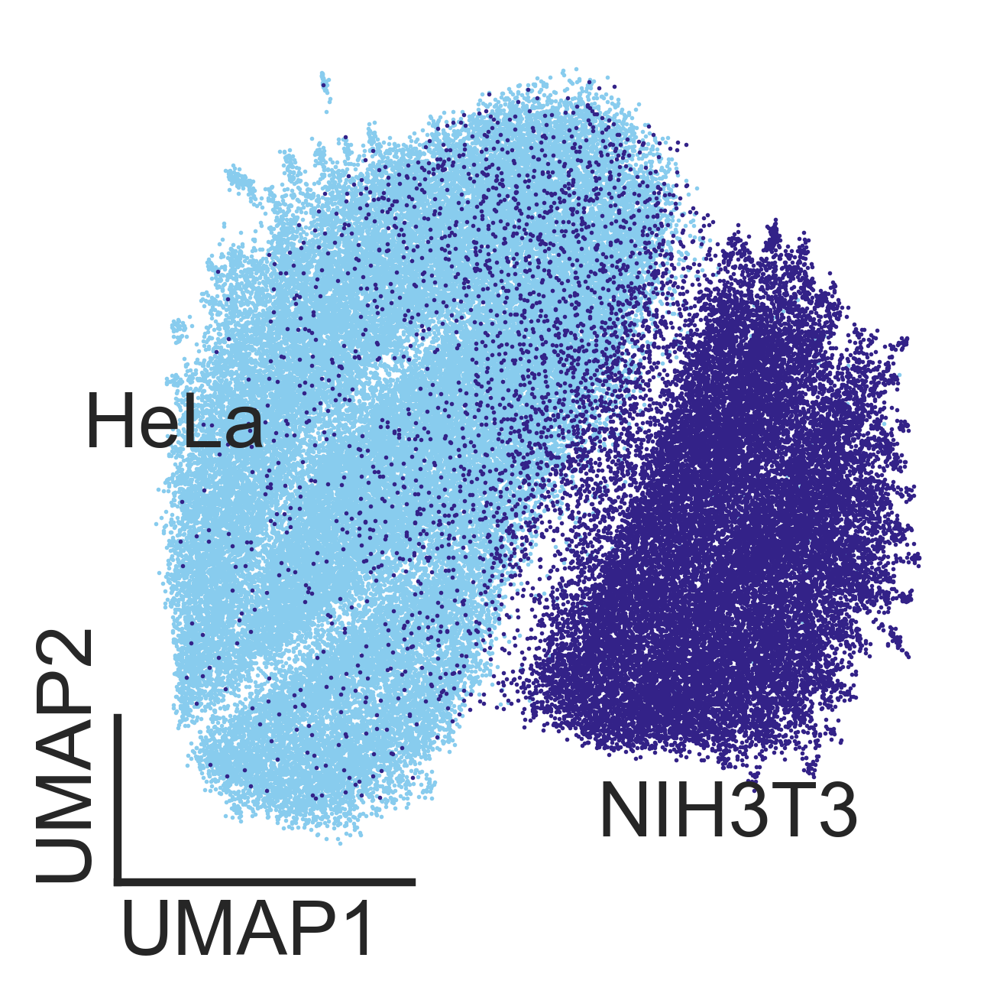

In [81]:
f = pl.highlight_scatterplot(
    data=adata_filt,
    obsm_key="X_umap",
    hue='CellLine',  
    palette=palette,
    decorate_titles=False, 
    height=4,
    aspect=1,
    trim_axes=True,
    scatter_kwargs={'s':1})
#f.add_legend(markerscale=6)
plt.text(x=-6, y=6, s='HeLa', size=18)
plt.text(x=6, y=1, s='NIH3T3', size=18)
plt.xlabel('UMAP1', loc='left', fontsize=18)
plt.ylabel('UMAP2', loc='bottom', fontsize=18)

plt.savefig(plots_path / 'panel_M.png', bbox_inches='tight')
plt.savefig(plots_path / 'panel_M.svg', bbox_inches='tight')

## Panel N

### Set paths

In [82]:
#input
data_dir = Path(r'../data')
anndata_path = data_dir / 'SC1_normalized.h5ad'
bulk_path = data_dir / 'Bulk1_TIC.csv'
markers_path = data_dir / 'SC1_DA_markers.csv'

#output
plots_path =  Path(r'../') / 'figures' / 'figure_3'
plots_path.mkdir(parents=True, exist_ok=True)
sc.settings.figdir = plots_path

### Load data

In [83]:
#load anndata file
adata = sc.read_h5ad(anndata_path)
adata.raw = adata

#load bulk data
bulk_data = pd.read_csv(bulk_path, index_col='formula')

#load markers file
DA_markers = pd.read_csv(markers_path)

### Dot plot

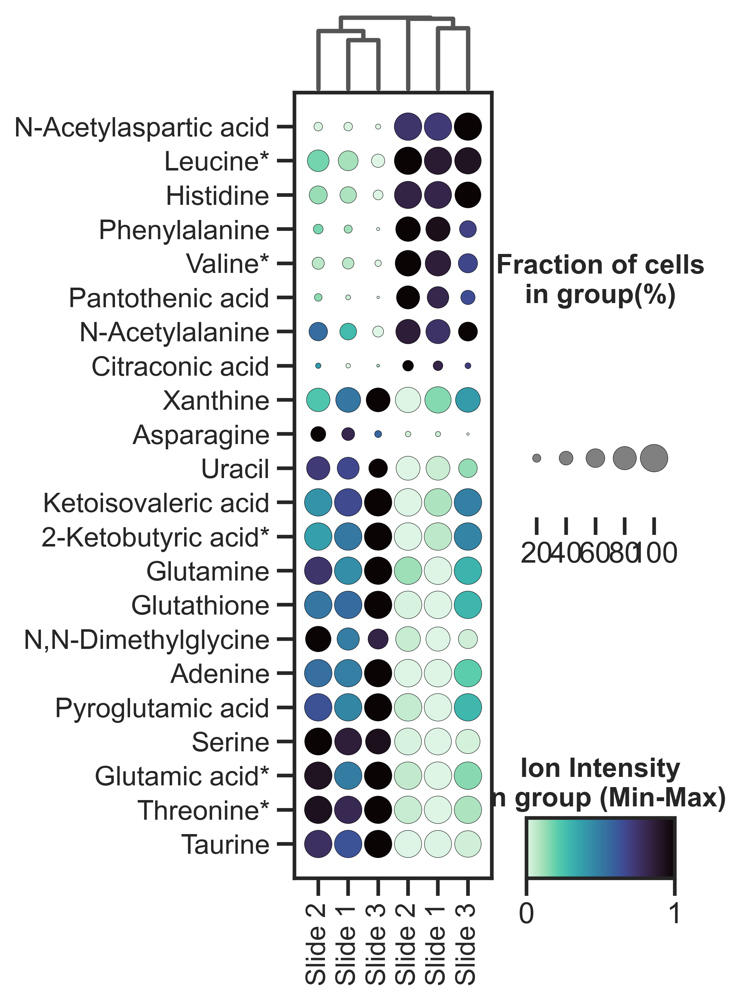

In [84]:
ax = sc.pl.dotplot(adata,
                   var_names=DA_markers['ion'],
                   groupby='slide_condition',
                   dendrogram=True,
                   figsize=[3.5, 8],
                   swap_axes=True,
                   show=False,
                   cmap='mako_r',
                   layer='norm_counts',
                   standard_scale='var',
                   mean_only_expressed=False)

ax['mainplot_ax'].set_yticklabels(labels=DA_markers['metabolites2'], fontsize=14)
ax['mainplot_ax'].set_xticklabels(labels=['Slide 2', 'Slide 1', 'Slide 3', 
                                          'Slide 2', 'Slide 1', 'Slide 3'],
                                  fontsize=14)
ax['color_legend_ax'].set_title(label='Ion Intensity\n in group (Min-Max)', fontsize=14,  weight='bold')
ax['size_legend_ax'].set_title(label='Fraction of cells\nin group(%)', fontsize=14,  weight='bold')

plt.savefig(plots_path / 'panel_N_dotplot.png', bbox_inches='tight')
plt.savefig(plots_path / 'panel_N_dotplot.svg', bbox_inches='tight')

### Heat map

In [85]:
bulk_filt = bulk_data[bulk_data['metabolites'].isin(DA_markers['metabolites'])]
list_order = ['N-Acetylaspartic acid','Leucine','Histidine','Phenylalanine','Valine','Pantothenic acid',
              'N-Acetylalanine','Citraconic acid','Xanthine','Asparagine','Uracil','Ketoisovaleric acid',
              '2-Ketobutyric acid','Glutamine','Glutathione','N,N-Dimethylglycine','Adenine',
              'Pyroglutamic acid','Serine','Glutamic acid','Threonine','Taurine']

bulk_filt['metabolites'] = pd.Categorical(bulk_filt['metabolites'], list_order)
bulk_filt = bulk_filt.sort_values(by='metabolites').set_index('metabolites')

bulk_heatmap= bulk_filt.drop(labels=['m/z','m/z_range','adduct','detection','validation'], axis=1)

/var/folders/yd/30x9k4ks4xgcqd7x9_jk19c40000gn/T/ipykernel_33986/2108426351.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  bulk_filt['metabolites'] = pd.Categorical(bulk_filt['metabolites'], list_order)


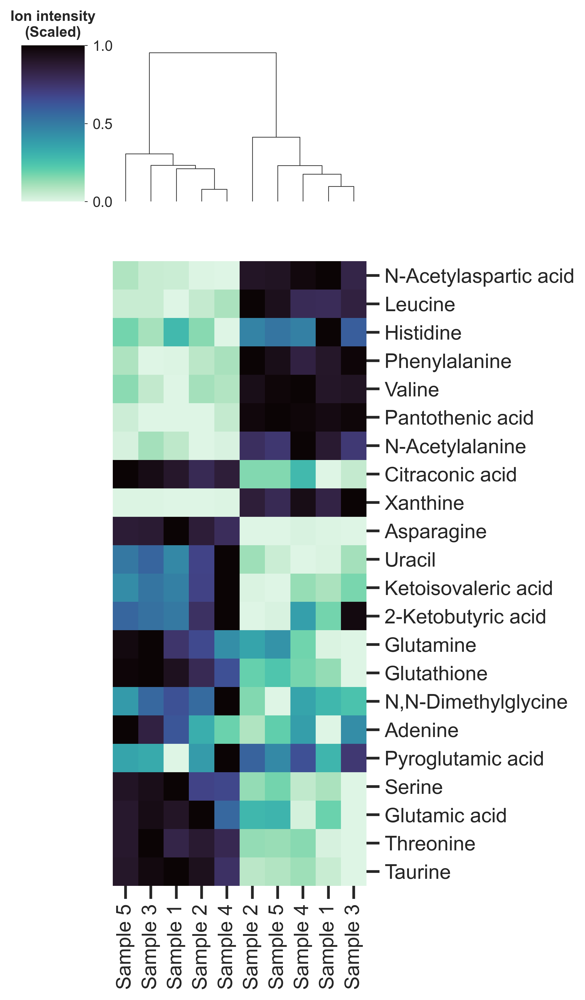

In [86]:
ax = sns.clustermap(bulk_heatmap, 
                    cmap='mako_r',
                    cbar_kws={'aspect':0.1, 'shrink':0.7, 'ticks':(0, 0.5, 1.00)},
                    standard_scale=0,
                    row_cluster=False,
                    figsize=(6,10))

cax=ax.figure.axes[-1]
pax=ax.figure.axes[0]
cax.tick_params(width=0.5, length=2,labelsize=10)
cax.set_title('Ion intensity\n(Scaled)', size=10, weight='bold')

ax.ax_heatmap.set_yticklabels(DA_markers['metabolites'], size=14)
ax.ax_heatmap.set_xticklabels(labels=['Sample 3','Sample 1','Sample 4','Sample 5','Sample 2',
                                      'Sample 4','Sample 2','Sample 1','Sample 3','Sample 5'], size=14)
ax.ax_heatmap.set_ylabel(None)
ax.ax_heatmap.set_xlabel(None)
ax.ax_heatmap.invert_xaxis()
plt.ylabel(None)
plt.xlabel(None)
plt.tight_layout()

plt.savefig(plots_path / 'panel_N_heatmap.png', bbox_inches='tight')
plt.savefig(plots_path / 'panel_N_heatmap.svg', bbox_inches='tight')